In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install segmentation_models_pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.4 MB/s eta 0:00:00


In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 111.6 MB/s eta 0:00:00


In [4]:
import os
import cv2
import numpy as np
import rasterio
import glob
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import random
import torch

In [5]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

test_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Normalize(mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225)),
    ToTensorV2()
])

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        mask = (mask > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 8, pin_memory = False, shuffle = True, num_workers = 8)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 8, pin_memory = False, shuffle = False, num_workers = 8)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[-2.1179, -2.1179, -1.8953,  ..., -0.1828, -0.1828, -0.1828],
         [-1.8268, -1.8953, -1.8953,  ..., -0.3541, -0.3541, -0.3541],
         [-1.8268, -1.8268, -1.8268,  ..., -0.7650, -0.7822, -0.7822],
         ...,
         [-2.0152, -1.9809, -1.9638,  ..., -0.9705, -0.9705, -0.9705],
         [-2.0494, -2.0494, -2.0323,  ..., -0.9705, -0.9705, -0.9705],
         [-2.1008, -2.0665, -2.0494,  ..., -0.9705, -0.9705, -0.9705]],

        [[-1.8782, -1.8081, -1.5630,  ..., -0.0224, -0.0224, -0.0224],
         [-1.4930, -1.5630, -1.5630,  ..., -0.1975, -0.1975, -0.1975],
         [-1.4930, -1.4930, -1.5105,  ..., -0.6176, -0.6352, -0.6352],
         ...,
         [-1.6331, -1.5980, -1.5805,  ..., -1.1954, -1.1954, -1.1779],
         [-1.6681, -1.6681, -1.6506,  ..., -1.1779, -1.1779, -1.1779],
         [-1.7031, -1.6856, -1.6681,  ..., -1.1779, -1.1779, -1.1604]],

        [[-1.8044, -1.7522, -1.5081,  ...,  0.1128,  0.1128,  0.1128],
         [-1.4559, -1.5081, -1.5081,  ..., -0

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[-1.3473, -1.4500, -1.4672,  ..., -0.5596, -0.2856, -1.2788],
         [-1.0390, -1.1418, -1.2103,  ..., -0.8507, -0.9192, -1.4158],
         [-0.9192, -0.9877, -1.0733,  ..., -1.5014, -1.3815, -1.0562],
         ...,
         [ 0.8789,  0.8961,  0.9303,  ..., -0.9363, -0.9705, -1.5699],
         [ 0.8789,  0.8961,  0.9132,  ..., -1.6384, -1.6555, -1.5185],
         [ 0.8618,  0.8789,  0.8961,  ..., -1.7412, -1.9809, -1.6555]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.4076, -0.0924, -1.1078],
         [-0.8803, -0.9853, -1.0553,  ..., -0.6527, -0.7402, -1.2129],
         [-0.7402, -0.8102, -0.8978,  ..., -1.3004, -1.1779, -0.7927],
         ...,
         [ 1.0280,  1.0455,  1.0805,  ..., -0.6877, -0.7227, -1.3354],
         [ 1.0280,  1.0455,  1.0630,  ..., -1.4055, -1.4405, -1.3004],
         [ 1.0105,  1.0280,  1.0455,  ..., -1.5105, -1.7731, -1.4405]],

        [[-1.1596, -1.2641, -1.2816,  ..., -0.2358,  0.1128, -0.8981],
         [-0.8458, -0.9504, -1.0201,  ..., -0

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.uint8)
torch.Size([256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[-0.8507, -1.0390, -1.1247,  ..., -1.4672, -1.2788, -1.2617],
         [-1.0733, -0.9192, -1.3130,  ..., -1.5014, -1.4500, -1.5357],
         [-1.0390, -0.6965, -1.1589,  ..., -1.3473, -1.3987, -1.5014],
         ...,
         [-1.3644, -1.3473, -1.3644,  ..., -0.9705, -0.6965, -0.9363],
         [-1.3987, -1.3644, -1.3644,  ..., -0.5253, -0.6452, -0.7993],
         [-1.4158, -1.3815, -1.3644,  ..., -0.9534, -0.6281, -0.5767]],

        [[-0.5126, -0.7052, -0.8102,  ..., -1.0028, -0.8102, -0.7927],
         [-0.7402, -0.5826, -1.0028,  ..., -1.0378, -0.9853, -1.0728],
         [-0.7052, -0.3550, -0.8277,  ..., -0.8803, -0.9328, -1.0378],
         ...,
         [-0.9153, -0.8978, -0.9153,  ..., -0.5301, -0.3375, -0.5826],
         [-0.9503, -0.9153, -0.9153,  ..., -0.0749, -0.2850, -0.4426],
         [-0.9678, -0.9328, -0.9153,  ..., -0.5126, -0.2675, -0.2150]],

        [[-0.4624, -0.6541, -0.7936,  ..., -0.8981, -0.7064, -0.6890],
         [-0.6890, -0.5321, -0.9853,  ..., -0

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[0, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 0, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]], dtype=torch.uint8)
torch.Size([256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256]

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([8, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [22]:
for img, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([8, 256, 256])
image shape: torch.Size([2, 3, 256, 256])
mask shape: torch.Size([2, 256, 256])


In [23]:
import segmentation_models_pytorch as smp
import torch.nn as nn
import torch.nn.functional as F

class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio = 16):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = max(1, num_channels // reduction_ratio)
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias = True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias = True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()

        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim = 2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        return input_tensor * fc_out_2.view(batch_size, num_channels, 1, 1)

class CustomDeepLabV3Plus(nn.Module):
    def __init__(self, encoder_name = "resnet101", encoder_weights = "imagenet", in_channels = 3, classes = 1):
        super(CustomDeepLabV3Plus, self).__init__()
        self.base_model = smp.DeepLabV3Plus(
            encoder_name = encoder_name,
            encoder_weights = encoder_weights,
            in_channels = in_channels,
            classes = 256,
            activation = None
        )

        self.head = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = True),
            ChannelSELayer(128),
            nn.Dropout2d(0.5),
            nn.Conv2d(128, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = True),
            ChannelSELayer(64),
            nn.Dropout2d(0.5),
            nn.Conv2d(64, classes, 1)
        )

    def forward(self, x):
        x = self.base_model(x)
        x = self.head(x)
        return x

def batchnorm_to_groupnorm(model, num_groups = 32):
    for name, module in model.named_children():
        if isinstance(module, nn.BatchNorm2d):
            num_features = module.num_features
            valid_num_groups = min(num_groups, num_features)
            while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                valid_num_groups -= 1
            setattr(model, name, nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features))
        else:
            batchnorm_to_groupnorm(module, num_groups)
    return model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

deeplab_model = CustomDeepLabV3Plus(
    encoder_name = "resnet101",
    encoder_weights = "imagenet",
    in_channels = 3,
    classes = 1
)

deeplab_model = batchnorm_to_groupnorm(deeplab_model)
deeplab_model.to(device)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

In [24]:
def calc_iou(pred, gt):
    with torch.no_grad():
        pred = (pred.sigmoid() > 0.5).long()
        pred, gt = pred.contiguous().view(-1), gt.contiguous().view(-1)

        if gt.sum() == 0:
          if pred.sum() == 0:
            return 1.0
          else:
            return 0.0

        intersect = torch.logical_and(pred > 0, gt > 0).sum().float().item()
        union = torch.logical_or(pred > 0, gt > 0).sum().float().item()

        iou = (intersect + 1e-6) / (union + 1e-6)

    return iou

In [25]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.0 * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        bce = F.binary_cross_entropy(inputs, targets, reduction = 'none')
        pt = torch.exp(-bce)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce).mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [26]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 12.4 MB/s eta 0:00:00


In [27]:
import torch.optim as optim
from tqdm import tqdm
import optuna
import warnings
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CosineAnnealingLR

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.Adam(model.parameters(), lr = 0.0001)

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, images_path, masks_path in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()

            outputs = model(images)
            loss = loss_func(outputs, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(outputs, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch+1}/{num_epoch}:")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")

        model.eval()
        val_loss = 0
        val_total_iou = 0

        with torch.no_grad():
            for val_images, val_masks, val_images_path, val_masks_path in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                val_output = model(val_images)
                val_loss += loss_func(val_output, val_masks.float()).item()

                val_batch_iou = calc_iou(val_output, val_masks)
                val_total_iou += val_batch_iou

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_total_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [28]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    deeplab_model = CustomDeepLabV3Plus(
        encoder_name = "resnet101",
        encoder_weights = "imagenet",
        in_channels = 3,
        classes = 1
    )

    deeplab_model = batchnorm_to_groupnorm(deeplab_model)
    deeplab_model.to(device)

    model, val_loss = train_model(
        model = deeplab_model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = model

    return val_loss

In [29]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.3, 0.7), (0.1, 0.9), (0.0, 1.0)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 9)

[I 2025-11-15 14:54:40,966] A new study created in memory with name: no-name-4858adbc-d388-403d-899c-16aae7ec81ef


Trial 0: scheduler = reducelr, dice weight = 0.0, focal weight = 1.0



100%|██████████| 18/18 [00:12<00:00,  1.45it/s]


Epoch 1/25:
Train loss: 0.03998029004368517, Train Avg IoU: 0.5051887918683483



100%|██████████| 3/3 [00:00<00:00,  3.11it/s]


Val loss: 0.03466850519180298, Val Avg IoU: 0.6520823965214587



100%|██████████| 18/18 [00:10<00:00,  1.79it/s]


Epoch 2/25:
Train loss: 0.03283821770714389, Train Avg IoU: 0.6345598568402924



100%|██████████| 3/3 [00:00<00:00,  3.43it/s]


Val loss: 0.03117303177714348, Val Avg IoU: 0.6804975144233872



100%|██████████| 18/18 [00:09<00:00,  1.89it/s]


Epoch 3/25:
Train loss: 0.031118039766119585, Train Avg IoU: 0.6719694555097525



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.030304061869780224, Val Avg IoU: 0.660686822917831



100%|██████████| 18/18 [00:09<00:00,  1.87it/s]


Epoch 4/25:
Train loss: 0.02994520879454083, Train Avg IoU: 0.6736464328624342



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.027200887600580852, Val Avg IoU: 0.7192244177994586



100%|██████████| 18/18 [00:10<00:00,  1.79it/s]


Epoch 5/25:
Train loss: 0.028287972427076764, Train Avg IoU: 0.7102648030849283



100%|██████████| 3/3 [00:01<00:00,  2.57it/s]


Val loss: 0.02356608894964059, Val Avg IoU: 0.7949332619905441



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 6/25:
Train loss: 0.024794928419093292, Train Avg IoU: 0.7478649720612334



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.022139184176921844, Val Avg IoU: 0.8145637471630077



100%|██████████| 18/18 [00:10<00:00,  1.78it/s]


Epoch 7/25:
Train loss: 0.022118462870518368, Train Avg IoU: 0.7864459638630152



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.01946638027826945, Val Avg IoU: 0.834824529153703



100%|██████████| 18/18 [00:10<00:00,  1.77it/s]


Epoch 8/25:
Train loss: 0.022227420575088926, Train Avg IoU: 0.7861198431399636



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.02095640078186989, Val Avg IoU: 0.8184968857451046



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 9/25:
Train loss: 0.02126865399380525, Train Avg IoU: 0.7931032405058672



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]


Val loss: 0.01788911782205105, Val Avg IoU: 0.8422496007950624



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 10/25:
Train loss: 0.01972278155800369, Train Avg IoU: 0.8071406462165637



100%|██████████| 3/3 [00:01<00:00,  2.82it/s]


Val loss: 0.018356419478853542, Val Avg IoU: 0.8368553609872764



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 11/25:
Train loss: 0.01892367646925979, Train Avg IoU: 0.8155645579800204



100%|██████████| 3/3 [00:01<00:00,  2.83it/s]


Val loss: 0.018547149375081062, Val Avg IoU: 0.8354199540010114



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 12/25:
Train loss: 0.018881750706997182, Train Avg IoU: 0.8194016848732034



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.016931527604659397, Val Avg IoU: 0.8510737172048568



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 13/25:
Train loss: 0.019651563786384132, Train Avg IoU: 0.8002049461888179



100%|██████████| 3/3 [00:00<00:00,  3.43it/s]


Val loss: 0.01971199984351794, Val Avg IoU: 0.8295244095117124



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 14/25:
Train loss: 0.01999907299048371, Train Avg IoU: 0.8014039798371246



100%|██████████| 3/3 [00:00<00:00,  3.45it/s]


Val loss: 0.01710592955350876, Val Avg IoU: 0.8463152668904051



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 15/25:
Train loss: 0.019276595777935453, Train Avg IoU: 0.8092681722052728



100%|██████████| 3/3 [00:00<00:00,  3.47it/s]


Val loss: 0.016951949646075565, Val Avg IoU: 0.8504599987579148



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 16/25:
Train loss: 0.018928243157764275, Train Avg IoU: 0.8112994168155



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.016529604171713192, Val Avg IoU: 0.851831202127087



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 17/25:
Train loss: 0.01872031856328249, Train Avg IoU: 0.807539582175753



100%|██████████| 3/3 [00:01<00:00,  2.76it/s]


Val loss: 0.016843954101204872, Val Avg IoU: 0.8493418199959346



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 18/25:
Train loss: 0.0183423539209697, Train Avg IoU: 0.8172761196133643



100%|██████████| 3/3 [00:01<00:00,  2.75it/s]


Val loss: 0.01697438210248947, Val Avg IoU: 0.8472181602645369



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 19/25:
Train loss: 0.018396269633538194, Train Avg IoU: 0.819095477375605



100%|██████████| 3/3 [00:00<00:00,  3.43it/s]


Val loss: 0.016431774323185284, Val Avg IoU: 0.8517837946328345



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 20/25:
Train loss: 0.017668425157252286, Train Avg IoU: 0.8248233200625289



100%|██████████| 3/3 [00:00<00:00,  3.41it/s]


Val loss: 0.01609876410414775, Val Avg IoU: 0.8529403916606412



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 21/25:
Train loss: 0.017715487991356187, Train Avg IoU: 0.8251503119401692



100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


Val loss: 0.016704721997181576, Val Avg IoU: 0.8482821939687873



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 22/25:
Train loss: 0.017574084663970604, Train Avg IoU: 0.8213231624871461



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.01628527541955312, Val Avg IoU: 0.85062753758115



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 23/25:
Train loss: 0.017064490200330813, Train Avg IoU: 0.8320352409706531



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.015887021087110043, Val Avg IoU: 0.8536677955935078



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 24/25:
Train loss: 0.016511965232590835, Train Avg IoU: 0.8350561403277403



100%|██████████| 3/3 [00:01<00:00,  2.64it/s]


Val loss: 0.015746410625676315, Val Avg IoU: 0.8542113537058728



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 25/25:
Train loss: 0.01699259452935722, Train Avg IoU: 0.828088668821997



100%|██████████| 3/3 [00:01<00:00,  2.78it/s]
[I 2025-11-15 14:59:26,194] Trial 0 finished with value: 0.015746410625676315 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.0, 1.0)}. Best is trial 0 with value: 0.015746410625676315.


Val loss: 0.016205784554282825, Val Avg IoU: 0.8508634102139826

Trial 1: scheduler = cosine, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 1/25:
Train loss: 0.16864358054267037, Train Avg IoU: 0.47540509756995264



100%|██████████| 3/3 [00:01<00:00,  2.50it/s]


Val loss: 0.1375924895207087, Val Avg IoU: 0.6614480989670278



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 2/25:
Train loss: 0.14656022936105728, Train Avg IoU: 0.6251337836771338



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.126530721783638, Val Avg IoU: 0.6958265097741654



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 3/25:
Train loss: 0.13583767165740332, Train Avg IoU: 0.6733747119186551



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.1214996228615443, Val Avg IoU: 0.714496256731698



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 4/25:
Train loss: 0.13099453474084535, Train Avg IoU: 0.7000495728303141



100%|██████████| 3/3 [00:00<00:00,  3.45it/s]


Val loss: 0.11727746079365413, Val Avg IoU: 0.7406152674309516



100%|██████████| 18/18 [00:10<00:00,  1.76it/s]


Epoch 5/25:
Train loss: 0.127428802765078, Train Avg IoU: 0.723350837325802



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.1104964017868042, Val Avg IoU: 0.7845703279747366



100%|██████████| 18/18 [00:10<00:00,  1.76it/s]


Epoch 6/25:
Train loss: 0.12106527181135283, Train Avg IoU: 0.7595627003841466



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.10395523657401402, Val Avg IoU: 0.8226431072243772



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 7/25:
Train loss: 0.11386329639289114, Train Avg IoU: 0.7838888593952994



100%|██████████| 3/3 [00:01<00:00,  2.72it/s]


Val loss: 0.09970515966415405, Val Avg IoU: 0.8383128676210614



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 8/25:
Train loss: 0.11118391611509854, Train Avg IoU: 0.7930667844450735



100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


Val loss: 0.09841189036766688, Val Avg IoU: 0.8314574736542747



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 9/25:
Train loss: 0.1093434633480178, Train Avg IoU: 0.7925615695165996



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.09515697260697682, Val Avg IoU: 0.8417301168120298



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 10/25:
Train loss: 0.10765279912286335, Train Avg IoU: 0.795468693271737



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.09493633111317952, Val Avg IoU: 0.8333222928549403



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 11/25:
Train loss: 0.1036053126056989, Train Avg IoU: 0.8121912117693126



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.09179157763719559, Val Avg IoU: 0.8475501018700542



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 12/25:
Train loss: 0.10235325205657217, Train Avg IoU: 0.8166942971299853



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.09026264647642772, Val Avg IoU: 0.848492461198315



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 13/25:
Train loss: 0.09820543684893185, Train Avg IoU: 0.8233529067294784



100%|██████████| 3/3 [00:00<00:00,  3.28it/s]


Val loss: 0.08920854826768239, Val Avg IoU: 0.8491351672143169



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 14/25:
Train loss: 0.09732255794935757, Train Avg IoU: 0.8264516165891614



100%|██████████| 3/3 [00:01<00:00,  2.64it/s]


Val loss: 0.08838712920745213, Val Avg IoU: 0.8501948895755432



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 15/25:
Train loss: 0.09751612403326565, Train Avg IoU: 0.8299056194532148



100%|██████████| 3/3 [00:01<00:00,  2.88it/s]


Val loss: 0.08771408100922902, Val Avg IoU: 0.8497496657256461



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 16/25:
Train loss: 0.10134547079602878, Train Avg IoU: 0.8179973929254738



100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


Val loss: 0.0863722413778305, Val Avg IoU: 0.8542497107674151



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 17/25:
Train loss: 0.09752957854006025, Train Avg IoU: 0.8239340650180034



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.08609443654616673, Val Avg IoU: 0.8528694539467011



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 18/25:
Train loss: 0.09893841875924005, Train Avg IoU: 0.818221885487015



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]


Val loss: 0.08565206329027812, Val Avg IoU: 0.8537766105969258



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 19/25:
Train loss: 0.09481609902448124, Train Avg IoU: 0.8264956040477348



100%|██████████| 3/3 [00:00<00:00,  3.42it/s]


Val loss: 0.08600761989752452, Val Avg IoU: 0.8505119784455911



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 20/25:
Train loss: 0.09341760021116999, Train Avg IoU: 0.8265357625770346



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.08540038516124089, Val Avg IoU: 0.8530458253830538



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 21/25:
Train loss: 0.09603510424494743, Train Avg IoU: 0.8295847441808033



100%|██████████| 3/3 [00:01<00:00,  2.72it/s]


Val loss: 0.085006482899189, Val Avg IoU: 0.8536552955360186



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 22/25:
Train loss: 0.09413442181216346, Train Avg IoU: 0.8267750089678222



100%|██████████| 3/3 [00:00<00:00,  3.12it/s]


Val loss: 0.08510408798853557, Val Avg IoU: 0.8526794277796594



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 23/25:
Train loss: 0.0940405676762263, Train Avg IoU: 0.8333157869778322



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.08502975354592006, Val Avg IoU: 0.8532334871813262



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 24/25:
Train loss: 0.09481548849079344, Train Avg IoU: 0.8282495491818284



100%|██████████| 3/3 [00:00<00:00,  3.43it/s]


Val loss: 0.08497609198093414, Val Avg IoU: 0.8529520531469542



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 25/25:
Train loss: 0.0925527877277798, Train Avg IoU: 0.8331741515987676



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]
[I 2025-11-15 15:04:15,076] Trial 1 finished with value: 0.08497482786575954 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.015746410625676315.


Val loss: 0.08497482786575954, Val Avg IoU: 0.8530115780419134

Trial 2: scheduler = reducelr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 1/25:
Train loss: 0.15642732423212793, Train Avg IoU: 0.5684173385159675



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.12791641304890314, Val Avg IoU: 0.6616350390345553



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 2/25:
Train loss: 0.13528508817156157, Train Avg IoU: 0.6503582959267998



100%|██████████| 3/3 [00:00<00:00,  3.23it/s]


Val loss: 0.11698120832443237, Val Avg IoU: 0.7028673220377563



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 3/25:
Train loss: 0.1288484459122022, Train Avg IoU: 0.6806365688246888



100%|██████████| 3/3 [00:01<00:00,  2.86it/s]


Val loss: 0.11292206247647603, Val Avg IoU: 0.7092487767235282



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 4/25:
Train loss: 0.12033857860498959, Train Avg IoU: 0.7057664629609438



100%|██████████| 3/3 [00:01<00:00,  2.59it/s]


Val loss: 0.1057913030187289, Val Avg IoU: 0.7582680375883276



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 5/25:
Train loss: 0.1181736762324969, Train Avg IoU: 0.7279625163396329



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.0977257490158081, Val Avg IoU: 0.7875059476670038



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 6/25:
Train loss: 0.10990697352422608, Train Avg IoU: 0.7651445854435989



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.09207547704378764, Val Avg IoU: 0.8294084789650525



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 7/25:
Train loss: 0.10784279720650779, Train Avg IoU: 0.7770926456515044



100%|██████████| 3/3 [00:00<00:00,  3.41it/s]


Val loss: 0.09091528753439586, Val Avg IoU: 0.8231590370348342



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 8/25:
Train loss: 0.10301369056105614, Train Avg IoU: 0.7938308932262835



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]


Val loss: 0.08716806769371033, Val Avg IoU: 0.8365368926443991



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 9/25:
Train loss: 0.09985096173153983, Train Avg IoU: 0.8000023631251774



100%|██████████| 3/3 [00:00<00:00,  3.48it/s]


Val loss: 0.08594596137603124, Val Avg IoU: 0.8370573000684898



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 10/25:
Train loss: 0.09711976266569561, Train Avg IoU: 0.8082405367539197



100%|██████████| 3/3 [00:01<00:00,  2.62it/s]


Val loss: 0.0842390904823939, Val Avg IoU: 0.8382696595514596



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 11/25:
Train loss: 0.09709739767842823, Train Avg IoU: 0.8081571254321295



100%|██████████| 3/3 [00:01<00:00,  2.72it/s]


Val loss: 0.08305993179480235, Val Avg IoU: 0.8397471949172569



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 12/25:
Train loss: 0.09653289491931598, Train Avg IoU: 0.8024697100850893



100%|██████████| 3/3 [00:00<00:00,  3.14it/s]


Val loss: 0.08143258343140285, Val Avg IoU: 0.8439221163641184



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 13/25:
Train loss: 0.09239216066069073, Train Avg IoU: 0.8187505180142307



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.08031860738992691, Val Avg IoU: 0.8456054447992131



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 14/25:
Train loss: 0.09045219959484206, Train Avg IoU: 0.8259532685106379



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.07893705119689305, Val Avg IoU: 0.8486338680242552



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 15/25:
Train loss: 0.09371520413292779, Train Avg IoU: 0.8101019772468114



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]


Val loss: 0.07693067193031311, Val Avg IoU: 0.8535190065682156



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 16/25:
Train loss: 0.08841290573279063, Train Avg IoU: 0.8243322157602403



100%|██████████| 3/3 [00:00<00:00,  3.41it/s]


Val loss: 0.07620201259851456, Val Avg IoU: 0.8531181558979397



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 17/25:
Train loss: 0.0889313022295634, Train Avg IoU: 0.8218410023844062



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.07673716793457667, Val Avg IoU: 0.8435550682279747



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 18/25:
Train loss: 0.08805837151077059, Train Avg IoU: 0.8251649312373138



100%|██████████| 3/3 [00:01<00:00,  2.40it/s]


Val loss: 0.07514136532942454, Val Avg IoU: 0.8493334379987602



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 19/25:
Train loss: 0.0861840018381675, Train Avg IoU: 0.8316355725244158



100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


Val loss: 0.07362612585226695, Val Avg IoU: 0.8540086772936939



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 20/25:
Train loss: 0.08558069003952874, Train Avg IoU: 0.8266724347692248



100%|██████████| 3/3 [00:00<00:00,  3.34it/s]


Val loss: 0.0731126939256986, Val Avg IoU: 0.8531833658305473



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 21/25:
Train loss: 0.08556898103819953, Train Avg IoU: 0.8210390381658548



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.07293915996948878, Val Avg IoU: 0.8512686748193469



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 22/25:
Train loss: 0.08116478183203274, Train Avg IoU: 0.8359315106402064



100%|██████████| 3/3 [00:00<00:00,  3.47it/s]


Val loss: 0.0708589032292366, Val Avg IoU: 0.8568069647810511



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 23/25:
Train loss: 0.08266270615988308, Train Avg IoU: 0.8296720533646279



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]


Val loss: 0.07290906210740407, Val Avg IoU: 0.8439444577264862



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 24/25:
Train loss: 0.08168519329693583, Train Avg IoU: 0.8300734905797245



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]


Val loss: 0.07017336040735245, Val Avg IoU: 0.8536783726619969



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 25/25:
Train loss: 0.08416213260756598, Train Avg IoU: 0.8154068133439808



100%|██████████| 3/3 [00:01<00:00,  2.54it/s]
[I 2025-11-15 15:09:03,271] Trial 2 finished with value: 0.07017336040735245 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.015746410625676315.


Val loss: 0.07109214117129643, Val Avg IoU: 0.8467941308818344

Trial 3: scheduler = reducelr, dice weight = 0.1, focal weight = 0.9



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 1/25:
Train loss: 0.08154372250040372, Train Avg IoU: 0.543554014783015



100%|██████████| 3/3 [00:01<00:00,  2.67it/s]


Val loss: 0.070193350315094, Val Avg IoU: 0.6382395930597561



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 2/25:
Train loss: 0.07068725116550922, Train Avg IoU: 0.6390477841623549



100%|██████████| 3/3 [00:00<00:00,  3.08it/s]


Val loss: 0.0626731738448143, Val Avg IoU: 0.6844473201920259



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 3/25:
Train loss: 0.06669337550799052, Train Avg IoU: 0.6665500562967852



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.05713140467802683, Val Avg IoU: 0.7361477550933989



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 4/25:
Train loss: 0.06144222037659751, Train Avg IoU: 0.7079343984539745



100%|██████████| 3/3 [00:00<00:00,  3.45it/s]


Val loss: 0.05618751794099808, Val Avg IoU: 0.7137376060095267



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 5/25:
Train loss: 0.05907511255807347, Train Avg IoU: 0.7258047641633006



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.04887502267956734, Val Avg IoU: 0.8035310896033149



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 6/25:
Train loss: 0.05540705079005824, Train Avg IoU: 0.7535482357603591



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.04427889486153921, Val Avg IoU: 0.8275361039465358



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 7/25:
Train loss: 0.05209665642016464, Train Avg IoU: 0.7762176830239768



100%|██████████| 3/3 [00:00<00:00,  3.43it/s]


Val loss: 0.04384959737459818, Val Avg IoU: 0.8218953077692207



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 8/25:
Train loss: 0.050078924745321274, Train Avg IoU: 0.7900454572386147



100%|██████████| 3/3 [00:01<00:00,  2.66it/s]


Val loss: 0.04158444205919901, Val Avg IoU: 0.8391738680941859



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 9/25:
Train loss: 0.04777041532927089, Train Avg IoU: 0.8025802698154929



100%|██████████| 3/3 [00:01<00:00,  2.73it/s]


Val loss: 0.04207926243543625, Val Avg IoU: 0.8355947261939137



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 10/25:
Train loss: 0.046973331520954766, Train Avg IoU: 0.8063485679868336



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]


Val loss: 0.040810391306877136, Val Avg IoU: 0.8416206841532304



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 11/25:
Train loss: 0.047560134488675326, Train Avg IoU: 0.7959714726357315



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.04135369136929512, Val Avg IoU: 0.8287268066850945



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 12/25:
Train loss: 0.04618934107323488, Train Avg IoU: 0.8060182382065443



100%|██████████| 3/3 [00:00<00:00,  3.41it/s]


Val loss: 0.039805916448434196, Val Avg IoU: 0.8368813258936738



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 13/25:
Train loss: 0.04375029562248124, Train Avg IoU: 0.8178071477308808



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.039122771471738815, Val Avg IoU: 0.8376507132277492



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 14/25:
Train loss: 0.044742173618740506, Train Avg IoU: 0.8147721520812435



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.03837251663208008, Val Avg IoU: 0.8443958158512929



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 15/25:
Train loss: 0.04372610772649447, Train Avg IoU: 0.8212930705660589



100%|██████████| 3/3 [00:01<00:00,  2.65it/s]


Val loss: 0.038285388300816216, Val Avg IoU: 0.8453291482115389



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 16/25:
Train loss: 0.04426936929424604, Train Avg IoU: 0.8192055280309376



100%|██████████| 3/3 [00:00<00:00,  3.06it/s]


Val loss: 0.03862116485834122, Val Avg IoU: 0.8433238337056447



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 17/25:
Train loss: 0.042569255663288966, Train Avg IoU: 0.8244661062376588



100%|██████████| 3/3 [00:00<00:00,  3.32it/s]


Val loss: 0.037957124412059784, Val Avg IoU: 0.8475959658614736



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 18/25:
Train loss: 0.04239904466602537, Train Avg IoU: 0.8230937199772571



100%|██████████| 3/3 [00:00<00:00,  3.45it/s]


Val loss: 0.03718342383702596, Val Avg IoU: 0.8504883979351349



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 19/25:
Train loss: 0.04373964522447851, Train Avg IoU: 0.8128214627164039



100%|██████████| 3/3 [00:00<00:00,  3.41it/s]


Val loss: 0.03799953187505404, Val Avg IoU: 0.8376997528264148



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 20/25:
Train loss: 0.04214620838562647, Train Avg IoU: 0.8250279038283914



100%|██████████| 3/3 [00:00<00:00,  3.42it/s]


Val loss: 0.03618257989486059, Val Avg IoU: 0.8512512623930002



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 21/25:
Train loss: 0.040849610749218196, Train Avg IoU: 0.8305000233795421



100%|██████████| 3/3 [00:01<00:00,  2.91it/s]


Val loss: 0.03614006067315737, Val Avg IoU: 0.8523239441169137



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 22/25:
Train loss: 0.04140547207660145, Train Avg IoU: 0.8268627606023726



100%|██████████| 3/3 [00:01<00:00,  2.55it/s]


Val loss: 0.03568438068032265, Val Avg IoU: 0.8554504402777967



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 23/25:
Train loss: 0.041922935388154454, Train Avg IoU: 0.8188824328393542



100%|██████████| 3/3 [00:00<00:00,  3.21it/s]


Val loss: 0.038201277454694114, Val Avg IoU: 0.8395010261770808



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 24/25:
Train loss: 0.04088888379434744, Train Avg IoU: 0.8293284299461424



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.035228196531534195, Val Avg IoU: 0.8543615679013145



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 25/25:
Train loss: 0.03952826538847552, Train Avg IoU: 0.8299095975712147



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]
[I 2025-11-15 15:13:52,838] Trial 3 finished with value: 0.03473770494262377 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.1, 0.9)}. Best is trial 0 with value: 0.015746410625676315.


Val loss: 0.03473770494262377, Val Avg IoU: 0.8553132327098952

Trial 4: scheduler = cosine, dice weight = 0.0, focal weight = 1.0



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 1/25:
Train loss: 0.039944801272617445, Train Avg IoU: 0.5160401474959112



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.03415593753258387, Val Avg IoU: 0.6485715095906454



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 2/25:
Train loss: 0.03191478964355257, Train Avg IoU: 0.6405491235893398



100%|██████████| 3/3 [00:00<00:00,  3.43it/s]


Val loss: 0.03190508236487707, Val Avg IoU: 0.6533012222584166



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 3/25:
Train loss: 0.03085501802464326, Train Avg IoU: 0.6573581014999793



100%|██████████| 3/3 [00:00<00:00,  3.42it/s]


Val loss: 0.02894516848027706, Val Avg IoU: 0.7272331583179573



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 4/25:
Train loss: 0.028457201810346708, Train Avg IoU: 0.7004974039937938



100%|██████████| 3/3 [00:01<00:00,  2.88it/s]


Val loss: 0.02667647289733092, Val Avg IoU: 0.7527402913760509



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 5/25:
Train loss: 0.027296274279554684, Train Avg IoU: 0.7263535674477661



100%|██████████| 3/3 [00:01<00:00,  2.55it/s]


Val loss: 0.02409634180366993, Val Avg IoU: 0.801401761657725



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 6/25:
Train loss: 0.025188176582256954, Train Avg IoU: 0.7514826430347153



100%|██████████| 3/3 [00:00<00:00,  3.19it/s]


Val loss: 0.021249697854121525, Val Avg IoU: 0.8222269587878112



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 7/25:
Train loss: 0.023858717332283657, Train Avg IoU: 0.7762646896085987



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.020147614181041718, Val Avg IoU: 0.837668433500228



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 8/25:
Train loss: 0.022613220537702244, Train Avg IoU: 0.7904561454499577



100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


Val loss: 0.020762288322051365, Val Avg IoU: 0.8290115541831863



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 9/25:
Train loss: 0.021873292461451557, Train Avg IoU: 0.7994297707582718



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.019320053979754448, Val Avg IoU: 0.841089111499735



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 10/25:
Train loss: 0.021572020836174488, Train Avg IoU: 0.8027899426451006



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.01858829955259959, Val Avg IoU: 0.8434875402853148



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 11/25:
Train loss: 0.02054495343731509, Train Avg IoU: 0.8046329582960515



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.01822433869043986, Val Avg IoU: 0.8483585773511516



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 12/25:
Train loss: 0.021556159481406212, Train Avg IoU: 0.8046929412478708



100%|██████████| 3/3 [00:01<00:00,  2.65it/s]


Val loss: 0.018406294286251068, Val Avg IoU: 0.8466654628415391



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 13/25:
Train loss: 0.02011673462887605, Train Avg IoU: 0.8136188053578794



100%|██████████| 3/3 [00:00<00:00,  3.04it/s]


Val loss: 0.01873273526628812, Val Avg IoU: 0.8418923988110052



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 14/25:
Train loss: 0.02052752771932218, Train Avg IoU: 0.8109329615319513



100%|██████████| 3/3 [00:00<00:00,  3.46it/s]


Val loss: 0.017994151761134464, Val Avg IoU: 0.8446334818715315



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 15/25:
Train loss: 0.019958784389826987, Train Avg IoU: 0.815108614829573



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.017658498759071033, Val Avg IoU: 0.8489289846476155



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 16/25:
Train loss: 0.02053774820847644, Train Avg IoU: 0.8044539202249955



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.01787554907302062, Val Avg IoU: 0.8401759024816405



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 17/25:
Train loss: 0.019903476763930585, Train Avg IoU: 0.8150196818244616



100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


Val loss: 0.01760152168571949, Val Avg IoU: 0.8463070923469692



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 18/25:
Train loss: 0.01937547657224867, Train Avg IoU: 0.8245117630458795



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.017408753434816997, Val Avg IoU: 0.8508933140184861



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 19/25:
Train loss: 0.01852332873062955, Train Avg IoU: 0.8238371555272757



100%|██████████| 3/3 [00:01<00:00,  2.65it/s]


Val loss: 0.017289534211158752, Val Avg IoU: 0.8510358343971692



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 20/25:
Train loss: 0.01865456998348236, Train Avg IoU: 0.8253520626600721



100%|██████████| 3/3 [00:01<00:00,  2.79it/s]


Val loss: 0.0172102985282739, Val Avg IoU: 0.8512241081562596



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 21/25:
Train loss: 0.018348736119353108, Train Avg IoU: 0.8305581069249196



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.01721355753640334, Val Avg IoU: 0.850760545661751



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 22/25:
Train loss: 0.01831083848244614, Train Avg IoU: 0.8328167272145889



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]


Val loss: 0.017191259811321895, Val Avg IoU: 0.8511174244485588



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 23/25:
Train loss: 0.018421376227504678, Train Avg IoU: 0.8245068150414704



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.017220069964726765, Val Avg IoU: 0.8514748888701115



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 24/25:
Train loss: 0.018304263655510213, Train Avg IoU: 0.8325644786441863



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]


Val loss: 0.017203294051190216, Val Avg IoU: 0.8514670856753943



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 25/25:
Train loss: 0.018730044830590487, Train Avg IoU: 0.8333642214283022



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]
[I 2025-11-15 15:18:41,201] Trial 4 finished with value: 0.017191259811321895 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.0, 1.0)}. Best is trial 0 with value: 0.015746410625676315.


Val loss: 0.017199894413352013, Val Avg IoU: 0.8513876098342061

Trial 5: scheduler = steplr, dice weight = 0.0, focal weight = 1.0



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 1/25:
Train loss: 0.03980556896163358, Train Avg IoU: 0.5149589711250208



100%|██████████| 3/3 [00:01<00:00,  2.74it/s]


Val loss: 0.03407741834719976, Val Avg IoU: 0.6460060011570375



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 2/25:
Train loss: 0.032360818340546556, Train Avg IoU: 0.6366643977101608



100%|██████████| 3/3 [00:01<00:00,  2.78it/s]


Val loss: 0.03149682283401489, Val Avg IoU: 0.668768648924547



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 3/25:
Train loss: 0.031363716762926847, Train Avg IoU: 0.6619058220216021



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.02908249758183956, Val Avg IoU: 0.7332565197651341



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 4/25:
Train loss: 0.029067625084684953, Train Avg IoU: 0.701391842637209



100%|██████████| 3/3 [00:00<00:00,  3.42it/s]


Val loss: 0.02697010524570942, Val Avg IoU: 0.7504849427560085



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 5/25:
Train loss: 0.027283150392274063, Train Avg IoU: 0.7306085386646574



100%|██████████| 3/3 [00:00<00:00,  3.41it/s]


Val loss: 0.023915830999612808, Val Avg IoU: 0.8024282960792101



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 6/25:
Train loss: 0.025246459887259536, Train Avg IoU: 0.7567687592369395



100%|██████████| 3/3 [00:00<00:00,  3.52it/s]


Val loss: 0.022322288403908413, Val Avg IoU: 0.8205120032114545



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 7/25:
Train loss: 0.024524477620919544, Train Avg IoU: 0.7760183884045615



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.020673522725701332, Val Avg IoU: 0.8342404578101722



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 8/25:
Train loss: 0.022777784822715655, Train Avg IoU: 0.7905178868883621



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]


Val loss: 0.020187287280956905, Val Avg IoU: 0.8362309368127673



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 9/25:
Train loss: 0.021797801471418805, Train Avg IoU: 0.7979415892703469



100%|██████████| 3/3 [00:01<00:00,  2.58it/s]


Val loss: 0.019407428801059723, Val Avg IoU: 0.8388392210384525



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 10/25:
Train loss: 0.021320836928983528, Train Avg IoU: 0.8064090920651337



100%|██████████| 3/3 [00:01<00:00,  2.77it/s]


Val loss: 0.019654440383116405, Val Avg IoU: 0.8355485121859787



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 11/25:
Train loss: 0.020843519415292475, Train Avg IoU: 0.8042075024123112



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.01842331389586131, Val Avg IoU: 0.8459074428810643



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 12/25:
Train loss: 0.02085670590814617, Train Avg IoU: 0.7976963262317165



100%|██████████| 3/3 [00:00<00:00,  3.45it/s]


Val loss: 0.018483129640420277, Val Avg IoU: 0.8458631223260058



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 13/25:
Train loss: 0.020176059359477624, Train Avg IoU: 0.8082159744211472



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.01823972848554452, Val Avg IoU: 0.846527378900371



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 14/25:
Train loss: 0.022407098362843197, Train Avg IoU: 0.7841011321249091



100%|██████████| 3/3 [00:00<00:00,  3.43it/s]


Val loss: 0.018307951589425404, Val Avg IoU: 0.8389086624114065



100%|██████████| 18/18 [00:10<00:00,  1.75it/s]


Epoch 15/25:
Train loss: 0.02104825319515334, Train Avg IoU: 0.8007332386815151



100%|██████████| 3/3 [00:00<00:00,  3.02it/s]


Val loss: 0.01876482677956422, Val Avg IoU: 0.8286685611672775



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 16/25:
Train loss: 0.020626232648889225, Train Avg IoU: 0.8030311213311241



100%|██████████| 3/3 [00:01<00:00,  2.55it/s]


Val loss: 0.018455870449543, Val Avg IoU: 0.8444949679402899



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 17/25:
Train loss: 0.020576214210854635, Train Avg IoU: 0.8152262179150349



100%|██████████| 3/3 [00:01<00:00,  2.97it/s]


Val loss: 0.017839775731166203, Val Avg IoU: 0.8490939299334049



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 18/25:
Train loss: 0.01954073251949416, Train Avg IoU: 0.8129209239875481



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.017933726931611698, Val Avg IoU: 0.8485184247744435



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 19/25:
Train loss: 0.019339733343157504, Train Avg IoU: 0.8210407975769338



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]


Val loss: 0.01776695065200329, Val Avg IoU: 0.8495401819444757



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 20/25:
Train loss: 0.01978594794248541, Train Avg IoU: 0.8116073944366734



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.017852790653705597, Val Avg IoU: 0.8483499202949996



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 21/25:
Train loss: 0.019212617849310238, Train Avg IoU: 0.8202113400791133



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.017867762595415115, Val Avg IoU: 0.8477214780928418



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 22/25:
Train loss: 0.01924732368853357, Train Avg IoU: 0.8207950528554273



100%|██████████| 3/3 [00:00<00:00,  3.24it/s]


Val loss: 0.017802260195215542, Val Avg IoU: 0.848241030137864



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 23/25:
Train loss: 0.019218556789888278, Train Avg IoU: 0.8190695567198055



100%|██████████| 3/3 [00:01<00:00,  2.72it/s]


Val loss: 0.017776804665724438, Val Avg IoU: 0.8484633048031305



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 24/25:
Train loss: 0.01915240256736676, Train Avg IoU: 0.8264789553457486



100%|██████████| 3/3 [00:00<00:00,  3.28it/s]


Val loss: 0.017708576594789822, Val Avg IoU: 0.848994078520337



100%|██████████| 18/18 [00:11<00:00,  1.63it/s]


Epoch 25/25:
Train loss: 0.020107271149754524, Train Avg IoU: 0.8017368279962569



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]
[I 2025-11-15 15:23:29,777] Trial 5 finished with value: 0.017708576594789822 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.0, 1.0)}. Best is trial 0 with value: 0.015746410625676315.


Val loss: 0.017719799031813938, Val Avg IoU: 0.8474882568421679

Trial 6: scheduler = steplr, dice weight = 0.1, focal weight = 0.9



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 1/25:
Train loss: 0.08200867142942217, Train Avg IoU: 0.5140843484102934



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.0709562102953593, Val Avg IoU: 0.634883894733659



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 2/25:
Train loss: 0.07041807307137384, Train Avg IoU: 0.6344240310114526



100%|██████████| 3/3 [00:00<00:00,  3.42it/s]


Val loss: 0.0625522459546725, Val Avg IoU: 0.6876533639312488



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 3/25:
Train loss: 0.06495380256738928, Train Avg IoU: 0.6787850994527378



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.06088342765967051, Val Avg IoU: 0.6684412688165223



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 4/25:
Train loss: 0.06337592109209961, Train Avg IoU: 0.702757965812569



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.05769070362051328, Val Avg IoU: 0.7108360787919623



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 5/25:
Train loss: 0.05987402838137415, Train Avg IoU: 0.7337391012423997



100%|██████████| 3/3 [00:00<00:00,  3.14it/s]


Val loss: 0.05099269996086756, Val Avg IoU: 0.7944383108100062



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 6/25:
Train loss: 0.056961387395858765, Train Avg IoU: 0.7554729939834095



100%|██████████| 3/3 [00:01<00:00,  2.67it/s]


Val loss: 0.04778866718212763, Val Avg IoU: 0.8178779823841965



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 7/25:
Train loss: 0.054485442116856575, Train Avg IoU: 0.7728146004254646



100%|██████████| 3/3 [00:00<00:00,  3.01it/s]


Val loss: 0.046747226268053055, Val Avg IoU: 0.826726570975269



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 8/25:
Train loss: 0.05340280673570103, Train Avg IoU: 0.785695466650372



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.04580244918664297, Val Avg IoU: 0.834772907436581



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 9/25:
Train loss: 0.052183647743529744, Train Avg IoU: 0.7901179551096379



100%|██████████| 3/3 [00:00<00:00,  3.45it/s]


Val loss: 0.04460893819729487, Val Avg IoU: 0.8411476355534164



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 10/25:
Train loss: 0.0511210546311405, Train Avg IoU: 0.80010664263593



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]


Val loss: 0.04419930279254913, Val Avg IoU: 0.8425221628060049



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 11/25:
Train loss: 0.05034194514155388, Train Avg IoU: 0.8052496998573515



100%|██████████| 3/3 [00:00<00:00,  3.41it/s]


Val loss: 0.04379544034600258, Val Avg IoU: 0.8419057434811644



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 12/25:
Train loss: 0.04928804582191838, Train Avg IoU: 0.8097017824656131



100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


Val loss: 0.04370887205004692, Val Avg IoU: 0.8445554311402713



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 13/25:
Train loss: 0.0493609050495757, Train Avg IoU: 0.813117015752466



100%|██████████| 3/3 [00:01<00:00,  2.67it/s]


Val loss: 0.043698910623788834, Val Avg IoU: 0.8398160440751269



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 14/25:
Train loss: 0.04865265265107155, Train Avg IoU: 0.8045806586239155



100%|██████████| 3/3 [00:00<00:00,  3.09it/s]


Val loss: 0.04406622052192688, Val Avg IoU: 0.83178955192151



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 15/25:
Train loss: 0.05065145136581527, Train Avg IoU: 0.7939121255472429



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.043170101940631866, Val Avg IoU: 0.8432109898745832



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 16/25:
Train loss: 0.04795163207583957, Train Avg IoU: 0.8106933127533699



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.04309021929899851, Val Avg IoU: 0.846272197025059



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 17/25:
Train loss: 0.04774805075592465, Train Avg IoU: 0.8192437272079806



100%|██████████| 3/3 [00:00<00:00,  3.25it/s]


Val loss: 0.042656004428863525, Val Avg IoU: 0.8478553604422437



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 18/25:
Train loss: 0.047926768039663635, Train Avg IoU: 0.8199231183361182



100%|██████████| 3/3 [00:00<00:00,  3.20it/s]


Val loss: 0.04270599658290545, Val Avg IoU: 0.8482719300327838



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 19/25:
Train loss: 0.04711448670261436, Train Avg IoU: 0.8244846793657317



100%|██████████| 3/3 [00:01<00:00,  2.68it/s]


Val loss: 0.04264324282606443, Val Avg IoU: 0.8488238978106569



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 20/25:
Train loss: 0.0476010303116507, Train Avg IoU: 0.8207899155941044



100%|██████████| 3/3 [00:01<00:00,  2.61it/s]


Val loss: 0.04239969700574875, Val Avg IoU: 0.8491583510893288



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 21/25:
Train loss: 0.04768559067613549, Train Avg IoU: 0.8197786208708024



100%|██████████| 3/3 [00:01<00:00,  2.82it/s]


Val loss: 0.04247404386599859, Val Avg IoU: 0.8495419862173521



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 22/25:
Train loss: 0.04723464738991526, Train Avg IoU: 0.8222257224419315



100%|██████████| 3/3 [00:00<00:00,  3.43it/s]


Val loss: 0.04234828675786654, Val Avg IoU: 0.8488348665346015



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 23/25:
Train loss: 0.04748829806016551, Train Avg IoU: 0.8194092697005213



100%|██████████| 3/3 [00:00<00:00,  3.47it/s]


Val loss: 0.042404851565758385, Val Avg IoU: 0.8490900759964958



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 24/25:
Train loss: 0.047145901868740715, Train Avg IoU: 0.828463269806496



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.04225394750634829, Val Avg IoU: 0.8498977450466992



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 25/25:
Train loss: 0.047000683637128934, Train Avg IoU: 0.8209995759629056



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]
[I 2025-11-15 15:28:18,672] Trial 6 finished with value: 0.04225394750634829 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.1, 0.9)}. Best is trial 0 with value: 0.015746410625676315.


Val loss: 0.04231428106625875, Val Avg IoU: 0.8496116960133083

Trial 7: scheduler = steplr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 1/25:
Train loss: 0.1650493848654959, Train Avg IoU: 0.5301121059408166



100%|██████████| 3/3 [00:00<00:00,  3.42it/s]


Val loss: 0.13511807968219122, Val Avg IoU: 0.6675522269636914



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 2/25:
Train loss: 0.14285429442922273, Train Avg IoU: 0.6405911123719865



100%|██████████| 3/3 [00:00<00:00,  3.10it/s]


Val loss: 0.1223112220565478, Val Avg IoU: 0.7052192090523564



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 3/25:
Train loss: 0.13462162100606495, Train Avg IoU: 0.6829045199235545



100%|██████████| 3/3 [00:01<00:00,  2.61it/s]


Val loss: 0.11909181873003642, Val Avg IoU: 0.7202039929353902



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 4/25:
Train loss: 0.12659587090214094, Train Avg IoU: 0.7182156559255656



100%|██████████| 3/3 [00:01<00:00,  2.84it/s]


Val loss: 0.11117284248272578, Val Avg IoU: 0.7751584921996559



100%|██████████| 18/18 [00:10<00:00,  1.64it/s]


Epoch 5/25:
Train loss: 0.12293042242527008, Train Avg IoU: 0.7369090412661042



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.10608922690153122, Val Avg IoU: 0.8127628085709828



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 6/25:
Train loss: 0.11731025245454577, Train Avg IoU: 0.7718387404486463



100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


Val loss: 0.10302003721396129, Val Avg IoU: 0.8247114387313405



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 7/25:
Train loss: 0.11635545351439053, Train Avg IoU: 0.7777874081282385



100%|██████████| 3/3 [00:00<00:00,  3.41it/s]


Val loss: 0.09993975857893626, Val Avg IoU: 0.8421015616769014



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 8/25:
Train loss: 0.11403397801849577, Train Avg IoU: 0.7932272475168793



100%|██████████| 3/3 [00:00<00:00,  3.46it/s]


Val loss: 0.10119848201672237, Val Avg IoU: 0.8280819025904412



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 9/25:
Train loss: 0.1105293586022324, Train Avg IoU: 0.7957969737807183



100%|██████████| 3/3 [00:00<00:00,  3.47it/s]


Val loss: 0.09782866140206654, Val Avg IoU: 0.8416814220504479



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 10/25:
Train loss: 0.10936634615063667, Train Avg IoU: 0.8159044682189833



100%|██████████| 3/3 [00:01<00:00,  2.61it/s]


Val loss: 0.09744720160961151, Val Avg IoU: 0.8410721170483354



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 11/25:
Train loss: 0.10678325262334612, Train Avg IoU: 0.8167162161159095



100%|██████████| 3/3 [00:01<00:00,  2.67it/s]


Val loss: 0.09579418351252873, Val Avg IoU: 0.8492125307134278



100%|██████████| 18/18 [00:10<00:00,  1.65it/s]


Epoch 12/25:
Train loss: 0.10814126746522056, Train Avg IoU: 0.8133840564227887



100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


Val loss: 0.09557933608690898, Val Avg IoU: 0.8481950615405748



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 13/25:
Train loss: 0.10687434673309326, Train Avg IoU: 0.805127156537616



100%|██████████| 3/3 [00:00<00:00,  3.44it/s]


Val loss: 0.09555978576342265, Val Avg IoU: 0.8454144175652929



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 14/25:
Train loss: 0.10733355830113094, Train Avg IoU: 0.7970142120985001



100%|██████████| 3/3 [00:00<00:00,  3.38it/s]


Val loss: 0.09554850806792577, Val Avg IoU: 0.8430289203075235



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 15/25:
Train loss: 0.10804547328088018, Train Avg IoU: 0.8073516376836732



100%|██████████| 3/3 [00:00<00:00,  3.26it/s]


Val loss: 0.09410408139228821, Val Avg IoU: 0.8505533586002763



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 16/25:
Train loss: 0.10596640490823322, Train Avg IoU: 0.8175154293820911



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.09431673586368561, Val Avg IoU: 0.8481429397145613



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 17/25:
Train loss: 0.1041368982858128, Train Avg IoU: 0.8228429344135205



100%|██████████| 3/3 [00:01<00:00,  2.66it/s]


Val loss: 0.09385985632737477, Val Avg IoU: 0.850554115586318



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 18/25:
Train loss: 0.10461881467037731, Train Avg IoU: 0.8113553533330089



100%|██████████| 3/3 [00:01<00:00,  2.65it/s]


Val loss: 0.09356455753246944, Val Avg IoU: 0.8516558986992379



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 19/25:
Train loss: 0.10425454750657082, Train Avg IoU: 0.8277021959505259



100%|██████████| 3/3 [00:00<00:00,  3.29it/s]


Val loss: 0.09373968839645386, Val Avg IoU: 0.8488733501588926



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 20/25:
Train loss: 0.10306701767775747, Train Avg IoU: 0.8196703146720966



100%|██████████| 3/3 [00:00<00:00,  3.35it/s]


Val loss: 0.0932334413131078, Val Avg IoU: 0.851059646806677



100%|██████████| 18/18 [00:10<00:00,  1.76it/s]


Epoch 21/25:
Train loss: 0.10375035968091753, Train Avg IoU: 0.8248808947654268



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]


Val loss: 0.09318198760350545, Val Avg IoU: 0.850914158096948



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 22/25:
Train loss: 0.10426478667391671, Train Avg IoU: 0.825153331016641



100%|██████████| 3/3 [00:00<00:00,  3.51it/s]


Val loss: 0.09307055920362473, Val Avg IoU: 0.8510529885903125



100%|██████████| 18/18 [00:10<00:00,  1.76it/s]


Epoch 23/25:
Train loss: 0.10278887798388799, Train Avg IoU: 0.8246393018980958



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.09291103482246399, Val Avg IoU: 0.8515894171604975



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 24/25:
Train loss: 0.10102107831173474, Train Avg IoU: 0.8307720273044417



100%|██████████| 3/3 [00:01<00:00,  2.74it/s]


Val loss: 0.09272784739732742, Val Avg IoU: 0.8517792889362451



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 25/25:
Train loss: 0.10277355462312698, Train Avg IoU: 0.8224551296474211



100%|██████████| 3/3 [00:01<00:00,  2.60it/s]
[I 2025-11-15 15:33:06,636] Trial 7 finished with value: 0.09272784739732742 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.015746410625676315.


Val loss: 0.09301340828339259, Val Avg IoU: 0.85058762043301

Trial 8: scheduler = cosine, dice weight = 0.1, focal weight = 0.9



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 1/25:
Train loss: 0.08038589565290345, Train Avg IoU: 0.5431118603840867



100%|██████████| 3/3 [00:01<00:00,  2.52it/s]


Val loss: 0.06660509606202443, Val Avg IoU: 0.6723723119809127



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 2/25:
Train loss: 0.06909316798879041, Train Avg IoU: 0.6515750778081628



100%|██████████| 3/3 [00:00<00:00,  3.28it/s]


Val loss: 0.0631165827314059, Val Avg IoU: 0.6773931678546417



100%|██████████| 18/18 [00:10<00:00,  1.70it/s]


Epoch 3/25:
Train loss: 0.06638434032599132, Train Avg IoU: 0.6615074570716017



100%|██████████| 3/3 [00:00<00:00,  3.27it/s]


Val loss: 0.05876679594318072, Val Avg IoU: 0.7256945077959595



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 4/25:
Train loss: 0.06265336502757338, Train Avg IoU: 0.7033894147837763



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.05415219937761625, Val Avg IoU: 0.7727812059825302



100%|██████████| 18/18 [00:10<00:00,  1.76it/s]


Epoch 5/25:
Train loss: 0.0598229645854897, Train Avg IoU: 0.7377961429379742



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.05004615460832914, Val Avg IoU: 0.8126982457565362



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 6/25:
Train loss: 0.05569250674711333, Train Avg IoU: 0.7699602566456676



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.04596456761161486, Val Avg IoU: 0.836379407634325



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 7/25:
Train loss: 0.0531003400683403, Train Avg IoU: 0.785219684406734



100%|██████████| 3/3 [00:01<00:00,  2.72it/s]


Val loss: 0.04463279123107592, Val Avg IoU: 0.8416407464167963



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 8/25:
Train loss: 0.050600462696618505, Train Avg IoU: 0.7963445252031904



100%|██████████| 3/3 [00:01<00:00,  2.54it/s]


Val loss: 0.043727315962314606, Val Avg IoU: 0.8419169039751301



100%|██████████| 18/18 [00:10<00:00,  1.66it/s]


Epoch 9/25:
Train loss: 0.049754575515786804, Train Avg IoU: 0.809352897347649



100%|██████████| 3/3 [00:00<00:00,  3.30it/s]


Val loss: 0.042886740217606224, Val Avg IoU: 0.8473534339321445



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 10/25:
Train loss: 0.049696520177854434, Train Avg IoU: 0.8057376257511522



100%|██████████| 3/3 [00:00<00:00,  3.34it/s]


Val loss: 0.043162621557712555, Val Avg IoU: 0.8448102582391224



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 11/25:
Train loss: 0.047764786001708776, Train Avg IoU: 0.8165123030673151



100%|██████████| 3/3 [00:00<00:00,  3.31it/s]


Val loss: 0.04238836591442426, Val Avg IoU: 0.8442197374985012



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 12/25:
Train loss: 0.04850642279618316, Train Avg IoU: 0.806110691556009



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]


Val loss: 0.04145220542947451, Val Avg IoU: 0.8501859987136194



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 13/25:
Train loss: 0.046726545318961143, Train Avg IoU: 0.8195767001871382



100%|██████████| 3/3 [00:00<00:00,  3.33it/s]


Val loss: 0.041293530414501824, Val Avg IoU: 0.8502395245803157



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 14/25:
Train loss: 0.04632097544769446, Train Avg IoU: 0.8177523254960788



100%|██████████| 3/3 [00:01<00:00,  2.70it/s]


Val loss: 0.04140633841355642, Val Avg IoU: 0.8413418273417147



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 15/25:
Train loss: 0.046008092247777514, Train Avg IoU: 0.8224346456608898



100%|██████████| 3/3 [00:01<00:00,  2.72it/s]


Val loss: 0.040841380755106606, Val Avg IoU: 0.8480295095212492



100%|██████████| 18/18 [00:10<00:00,  1.68it/s]


Epoch 16/25:
Train loss: 0.04667693066100279, Train Avg IoU: 0.8180841116259094



100%|██████████| 3/3 [00:00<00:00,  3.47it/s]


Val loss: 0.04050486907362938, Val Avg IoU: 0.8495838735484602



100%|██████████| 18/18 [00:10<00:00,  1.71it/s]


Epoch 17/25:
Train loss: 0.04522833124630981, Train Avg IoU: 0.8271282515217541



100%|██████████| 3/3 [00:00<00:00,  3.37it/s]


Val loss: 0.040450405329465866, Val Avg IoU: 0.8483073690959847



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 18/25:
Train loss: 0.04476355264584223, Train Avg IoU: 0.8234456523036078



100%|██████████| 3/3 [00:00<00:00,  3.44it/s]


Val loss: 0.04014759138226509, Val Avg IoU: 0.851194770831715



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 19/25:
Train loss: 0.04486290531025992, Train Avg IoU: 0.8265558870303656



100%|██████████| 3/3 [00:00<00:00,  3.36it/s]


Val loss: 0.04002547884980837, Val Avg IoU: 0.8516891130692522



100%|██████████| 18/18 [00:10<00:00,  1.72it/s]


Epoch 20/25:
Train loss: 0.04513355241053634, Train Avg IoU: 0.8289262341381394



100%|██████████| 3/3 [00:00<00:00,  3.24it/s]


Val loss: 0.039975713938474655, Val Avg IoU: 0.8525496480907707



100%|██████████| 18/18 [00:10<00:00,  1.73it/s]


Epoch 21/25:
Train loss: 0.045398150053289205, Train Avg IoU: 0.8222884349030406



100%|██████████| 3/3 [00:01<00:00,  2.80it/s]


Val loss: 0.03989286099871, Val Avg IoU: 0.8521138260872084



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 22/25:
Train loss: 0.043846649014287524, Train Avg IoU: 0.8290475301335798



100%|██████████| 3/3 [00:01<00:00,  2.52it/s]


Val loss: 0.03985693554083506, Val Avg IoU: 0.8526279315537476



100%|██████████| 18/18 [00:10<00:00,  1.67it/s]


Epoch 23/25:
Train loss: 0.04381000395450327, Train Avg IoU: 0.8331461756847006



100%|██████████| 3/3 [00:00<00:00,  3.40it/s]


Val loss: 0.03977499529719353, Val Avg IoU: 0.8528203380701928



100%|██████████| 18/18 [00:10<00:00,  1.69it/s]


Epoch 24/25:
Train loss: 0.044367954755822815, Train Avg IoU: 0.8308703249305848



100%|██████████| 3/3 [00:00<00:00,  3.39it/s]


Val loss: 0.0397561676800251, Val Avg IoU: 0.8528587405517717



100%|██████████| 18/18 [00:10<00:00,  1.74it/s]


Epoch 25/25:
Train loss: 0.043671773539649114, Train Avg IoU: 0.8323577370280293



100%|██████████| 3/3 [00:00<00:00,  3.43it/s]
[I 2025-11-15 15:37:55,802] Trial 8 finished with value: 0.039754932125409446 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.1, 0.9)}. Best is trial 0 with value: 0.015746410625676315.


Val loss: 0.039754932125409446, Val Avg IoU: 0.852838343250175



In [30]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (0.0, 1.0)}
Best val loss: 0.015746410625676315


In [31]:
fine_tune_model.eval()

CustomDeepLabV3Plus(
  (base_model): DeepLabV3Plus(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): GroupNorm(32, 256, eps=1e-05, affine=True)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
  

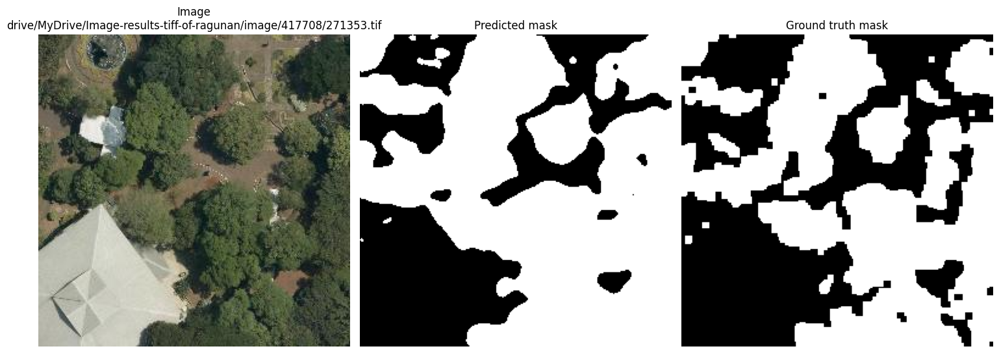

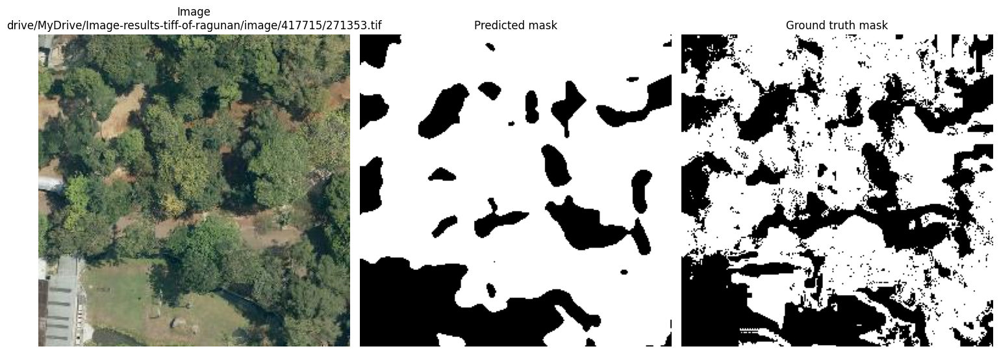

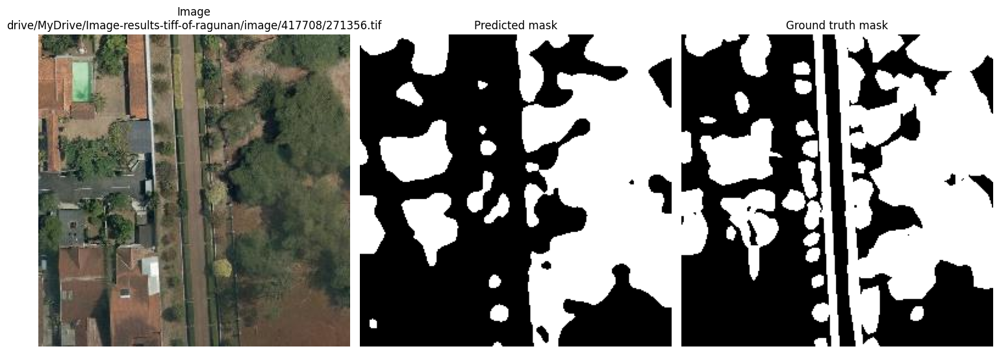

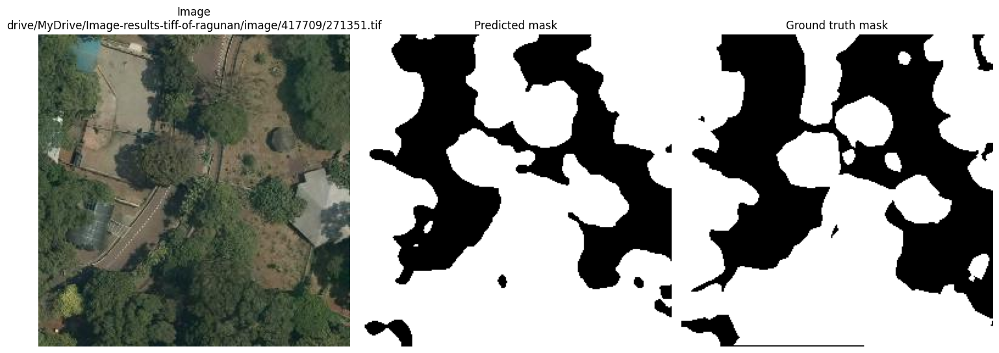

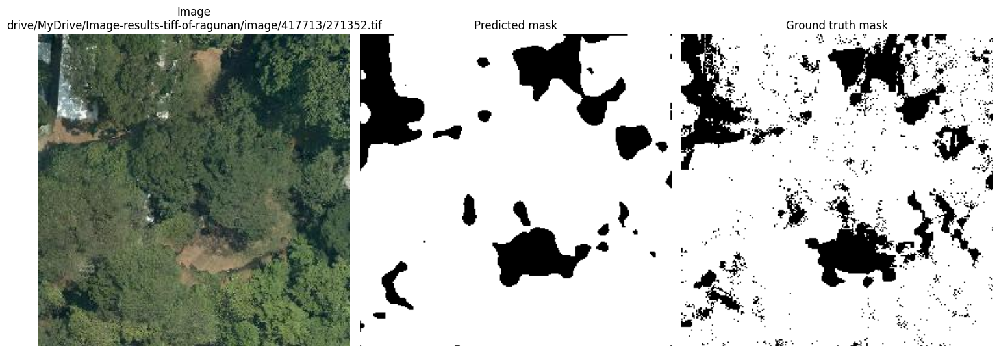

...

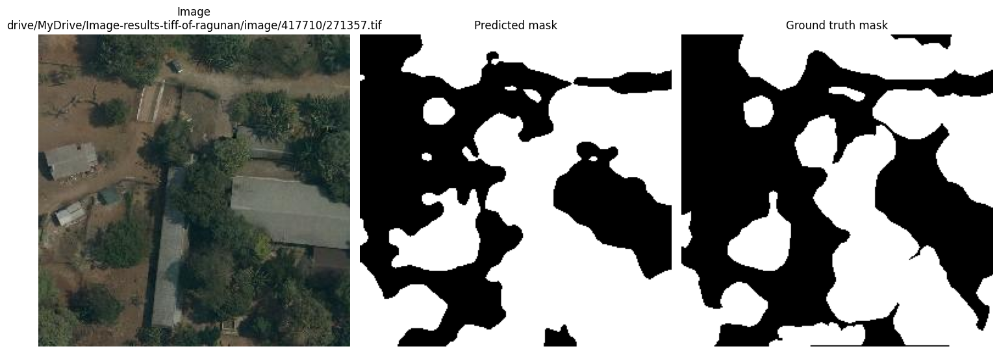

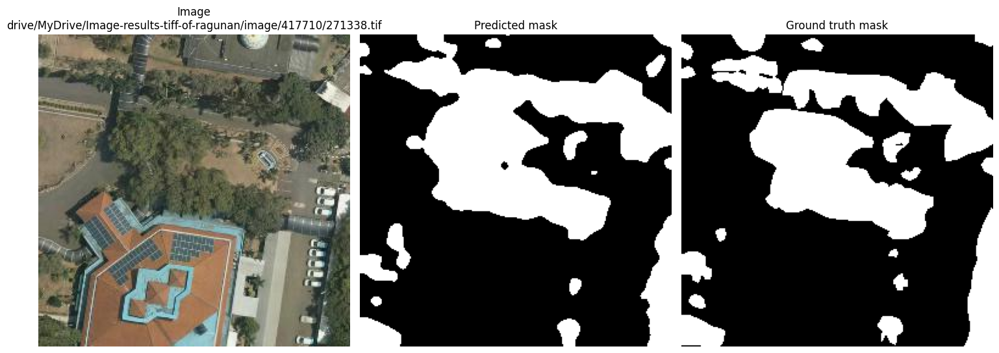

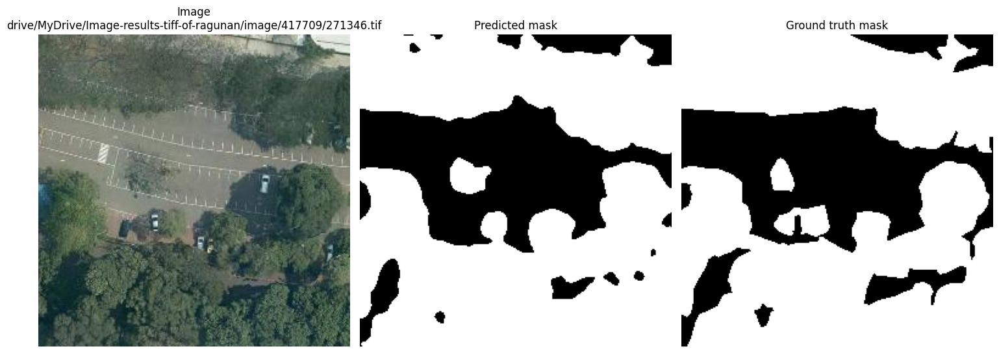

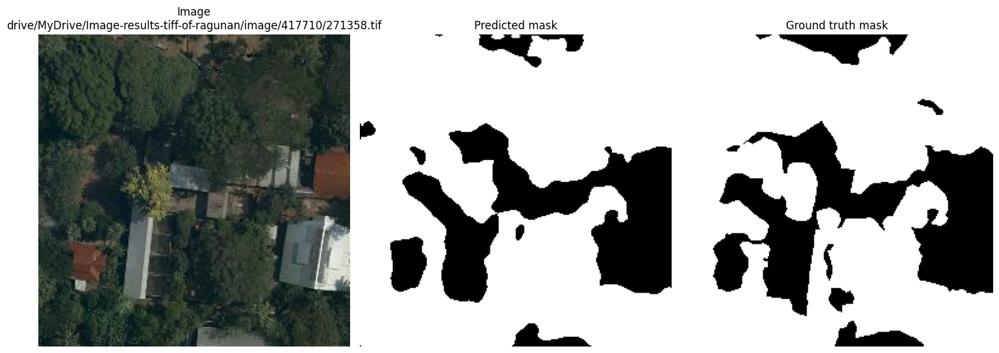

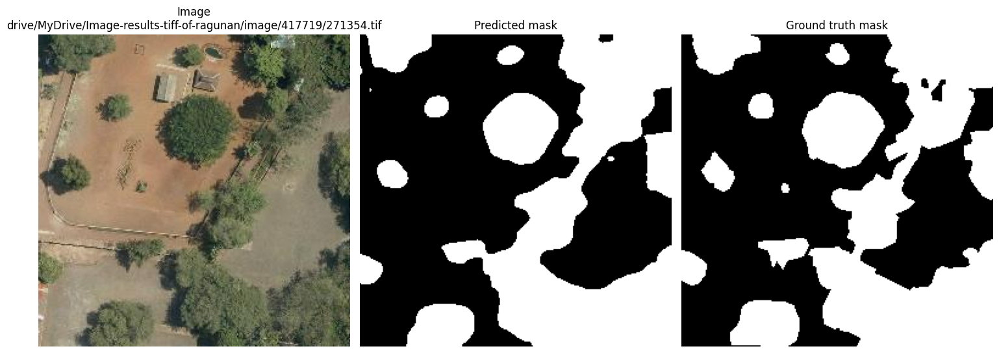

In [32]:
pred_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for image, mask, image_path, mask_path in test_loader:
        image = image.to(device)
        mask = mask.to(device)

        output = fine_tune_model(image)
        output = torch.sigmoid(output)
        pred_mask = (output > 0.5).float()

        for i in range(len(image_path)):
            img = image[i].cpu()
            img_path = image_path[i]

            if img.shape[0] == 1:
                img = img.squeeze(0).numpy()
            elif img.shape[0] == 3:
                img = img.permute(1, 2, 0).numpy()

            gt_mask = mask[i].cpu().squeeze().numpy()
            predicted_mask = pred_mask[i].cpu().squeeze().numpy()

            orig_image = Image.open(img_path).convert("RGB")
            orig_image = np.array(orig_image)

            gt_masks.append(gt_mask)
            pred_masks.append(predicted_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(orig_image)
            plt.axis("off")
            plt.title(f"Image\n{image_path[i]}")

            plt.subplot(1, 3, 2)
            plt.imshow(predicted_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Predicted mask")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap = "gray")
            plt.axis("off")
            plt.title("Ground truth mask")

            plt.tight_layout()
            plt.show()

In [33]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0

    iou = intersection / union
    return iou

In [34]:
iou_scores = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    pred_mask = (pred_masks[i] > 0.5).astype(np.uint8)
    gt_mask = (gt_masks[i] > 0.5).astype(np.uint8)

    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    pixels = np.sum(pred_mask == 1)
    veg_area = pixels * (GSD_x * GSD_y)
    iou_score = calculate_iou(pred_mask, gt_mask)

    iou_scores.append(iou_score)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou_score}")
    print("=====================================================")

print("=====================================================")
print(f"Average IoU score: {np.mean(iou_scores)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 42299
Vegetation coverage area: 23807.142487869132
IoU score: 0.7962085308056872
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 48055
Vegetation coverage area: 3734.2545656866378
IoU score: 0.7526307366062498
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 28779
Vegetation coverage area: 16197.682064786064
IoU score: 0.7266071837108213
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 43704
Vegetation coverage area: 24597.918515563786
IoU score: 0.8439176094109163
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 55319


In [37]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 23807.142487869132 m^2
Carbon density: 0.006854372875049474 ton/m^2
Estimated carbon stock: 163.18303170128803 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3734.2545656866378 m^2
Carbon density: 0.006854372875049474 ton/m^2
Estimated carbon stock: 25.595973203572143 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 16197.682064786064 m^2
Carbon density: 0.006854372875049474 ton/m^2
Estimated carbon stock: 111.02495258354496 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 24597.918515563786 m^2
Carbon density: 0.006854372875049474 ton/m^2
Estimated carbon stock: 168.60330545575763 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4298.724967624995 m^2
Carbon density: 0.